## CS4243 Lab 4: Optical Flow and Textons

**ASSIGNMENT SUBMISSION DEADLINE: Apr 26, 22h00**

**Instructions:**
- See `lab4.pdf` and `lab4.py` for detailed descriptions.

- The functions to be implemented are given in `lab4.py`, with a description of each function. You will need to fill in the code where it is marked with the following:
    ```
    # Your code starts here #

    # Your code ends here #
    ```
    
- For open questions, write your answers directly into the notebook. 

- You are free to use NumPy, OpenCV, scipy and skimage functions.

**Attention:**
- Please use python with version >= 3.8.4, and install the libs provided in requirements.txt via `conda install -c conda-forge ffmpeg ` and `pip install -r requirements.txt`.
- Please do not change the structure of files in the whole folder of this assignment, otherwise TA may mark your code wrongly.
- Please do not change the inputs arguments of the functions in `lab4.py`, otherwise your implementation would fail to pass the test.
- The functions in `utils.py` are to help us and should not have to be changed. Nonetheless, feel free to make adjustments if there are issues on your end.
- As long as your output is close to the expected answer, you will get full credit.

**Submission instructions:**

Upload to Canvas your completed lab4.py and lab4.ipynb by zipping them into a file named AXXX1_AXXX2.zip, where AXXX is the student number of the group members.  Submit one file per group.  Missing files, incorrectly formatted code that does not run, etc. will be penalized. 

If you have any question regarding this lab, do not hesistate to ask questions under the Labs section on Canvas Discussions. You can also attend any lab slot for FAQs.



To begin, load the following packages:


In [2]:
%load_ext autoreload
%autoreload 2

from lab4 import *
from utils import *
from tqdm import tqdm
from IPython.display import HTML

import os
os.environ["OMP_NUM_THREADS"] = "4" # export OMP_NUM_THREADS=4

## Part 1: Horn-Schonck Optical Flow

Run following code cell to load the video.

In [3]:
# load frames
path = "blackswan"

frames = load_frames_rgb(path)
testing_seq = frames[:10]
# video visualization
ani = animated_frames(frames)
display(HTML(ani.to_html5_video()))
plt.close()

In order to predict the segmentation of moving objects and background in the entire video. The very naive idea is to predict the segmentation by K-mean on pixel RGB features. The following code cell does this on the fisrt frame. 


C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


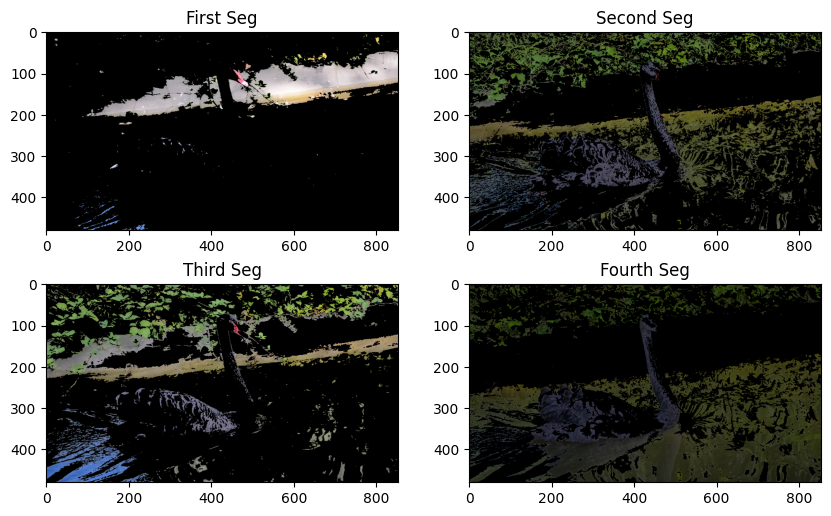

In [4]:
results = []
K=4

img = testing_seq[0]
label = kmeans(K, img)
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)


fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

To obtain the segmentation of the complete testing sequence, run the following cell:

In [5]:
results = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on RGB values'):
    label = kmeans(4, img)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB values: 0it [00:00, ?it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on RGB values: 1it [00:00,  6.52it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on RGB values: 2it [00:00,  6.14it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\Lo

### TASK 1.1 (40%)

Using only RGB values for segmentation cannot achieve the desired results. 
It can be observed that the movement of the swan is distinguishable from the background, so we use motion or displacement as features for segmentation.

**TASK 1.1: Complete `calcOpticalFlowHS()` in `lab4.py`. Run following code and tweak suitable smoothing parameter `lambda` and threshold `delta`.**

In [6]:
%%time
flows = []
vis = []

for i in tqdm(range(len(testing_seq)-1), desc='compute optical flow'):
    prvs = testing_seq[i]
    hsv = np.zeros_like(prvs)
    prvs = cv2.cvtColor(prvs, cv2.COLOR_BGR2GRAY)
    next = testing_seq[i+1]
    next = cv2.cvtColor(next, cv2.COLOR_BGR2GRAY)
    hsv[..., 1] = 255
    flow = calcOpticalFlowHS(prvs, next, param_lambda = 1, param_delta = 5000)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang*180/np.pi/2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    
    flows.append(flow) 
    vis.append(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))

ani = animated_frames(vis)
display(HTML(ani.to_html5_video()))
plt.close()

compute optical flow: 100%|██████████| 9/9 [02:35<00:00, 17.23s/it]


CPU times: total: 1min 22s
Wall time: 2min 35s


Run K-means on HornSchunck optical flow for the first frame. 
You will see the main object is well segmented. However, the background is noisy. 

C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


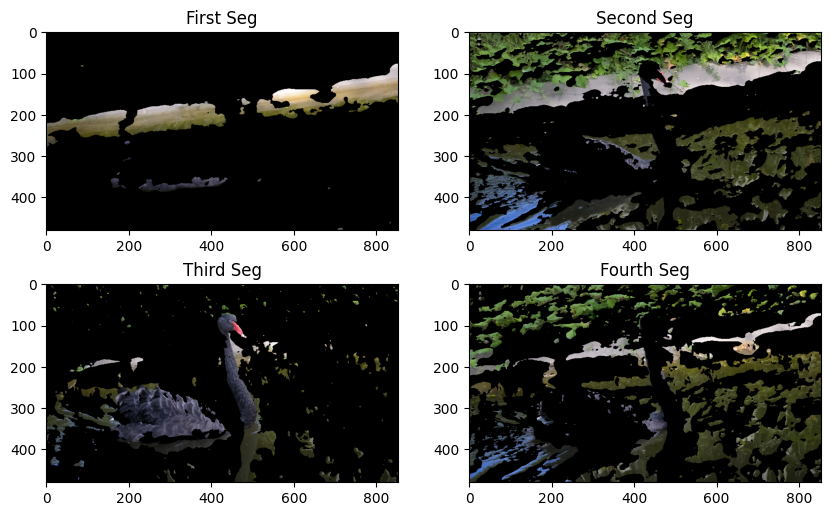

CPU times: total: 2.92 s
Wall time: 675 ms


In [7]:
%%time
results = []
K=4

img = testing_seq[0]
label = kmeans(K, flows[0])
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)

fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

Run the following cell to get the segmentation of the complete testing sequence.

In [8]:
results = []
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on flow feature'):
    label = kmeans(4, flow)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()


k-mean segmentation on flow feature: 0it [00:00, ?it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on flow feature: 1it [00:00,  5.84it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on flow feature: 2it [00:00,  5.75it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra

### TASK 1.2 (5%)

We then combine the appearance and motion evidence: concatenate the RGB values and optical flow to form the aggregated feature, and consider reweighting features for better results. 

**TASK 1.2: Use `combine_and_normalize_features()` in `lab4.py`. Run following code and tweak suitable weighting parameter `gamma`.**

In [9]:
results = []
gamma = 4.5
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=testing_seq[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 0it [00:00, ?it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on RGB feature: 1it [00:00,  5.81it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on RGB feature: 2it [00:00,  5.27it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0

### TASK 1.3 (5%)

- **How do the parameters `lambda` and `delta` affect the optical flow results?**

In the context of optical flow calculations using the Horn-Schunck method, the parameters lambda and delta play crucial roles in determining the smoothness of the flow field and the accuracy of the results. A smaller lambda prioritizes enforcing a smooth flow field over preserving distinct edges, potentially resulting in less defined edges in the output. Conversely, increasing lambda emphasizes brightness constancy, which can lead to sharper edges but might also introduce noise. Regarding delta, a larger value can lead to premature convergence, limiting the accuracy of the flow field. However, since the function typically doesn't approach zero, delta's impact might be less significant in practice, affecting the number of iterations and runtime more than the final result's quality.
- **How does the weighting parameter `gamma` affect the final segmentation results?**

In segmentation tasks involving both RGB values and flow features, the weighting parameter gamma plays a significant role in determining the influence of flow features on the final segmentation results. Increasing gamma places more emphasis on the flow features, making them more important compared to RGB values. Consequently, a higher gamma tends to produce segmentation outputs that prioritize flow-based boundaries over color-based ones. This leads to larger and more distinct segment boundaries, giving the segmentation output a more "chunky" appearance compared to results with a lower gamma, where RGB values have relatively more influence.

After adding appearance information, the white wall was effectively segmented, but the complex leaves were not. In the next section, we will use textons as features for segmentation.

## Section 2: Textons

The image is convolved with a 17-dimensional filter-bank at scale κ. The filter-bank consists of Gaussians at scales κ, 2κ and 4κ, x and y derivatives of Gaussians at scales 2κ and 4κ, and Laplacians of Gaussians at scales κ, 2κ, 4κ and 8κ.
Run following code to visualize them.


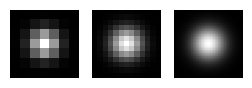

In [10]:
# Gaussians at scales κ, 2κ and 4κ

kappa = 1
kernels = {}

kernels['gaussian']=[]
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(3,1))  

for i, sigma in enumerate([kappa, 2*kappa, 4*kappa]):
    kg = build_gaussian_kernel(sigma=sigma)
    kernels['gaussian'].append(kg)
    ax[i].imshow(kg, cmap = 'gray')
    ax[i].axis("off")
    
plt.show()


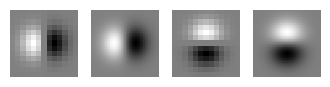

In [11]:
# x and y derivatives of Gaussians at scales 2κ and 4κ

kernels['gaussian_derivative']=[]
ydg2, xdg2 = build_gaussian_derivative_kernel(sigma=2*kappa)
ydg4, xdg4 = build_gaussian_derivative_kernel(sigma=4*kappa)

fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
ax[0].imshow(xdg2, cmap = 'gray')
ax[0].axis("off")
ax[1].imshow(xdg4, cmap = 'gray')
ax[1].axis("off")
ax[2].imshow(ydg2, cmap = 'gray')
ax[2].axis("off")
ax[3].imshow(ydg4, cmap = 'gray')
ax[3].axis("off")
plt.show()

kernels['gaussian_derivative'] = [ydg2, ydg4, xdg2, xdg4]

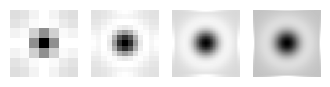

In [12]:
# Laplace of Gaussians at scales κ, 2κ and 4κ, 8k

kernels['LoG']=[]
fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
for i, sigma in enumerate([kappa, 2*kappa, 4*kappa, 8*kappa]):
    klg = build_LoG_kernel(sigma=sigma)
    ax[i].imshow(klg, cmap = 'gray')
    ax[i].axis("off")
    kernels['LoG'].append(klg)

plt.show()


After buiding the filter bank, run following code to load training image,  The Microsoft Research Cambridge (MSRC) database2 is composed of 591 photographs of the following 21 object classes: building, grass, tree, cow, sheep, sky, airplane, water, face, car, bicycle, flower, sign, bird, book, chair, road, cat, dog, body, and boat. Examples are shown below:

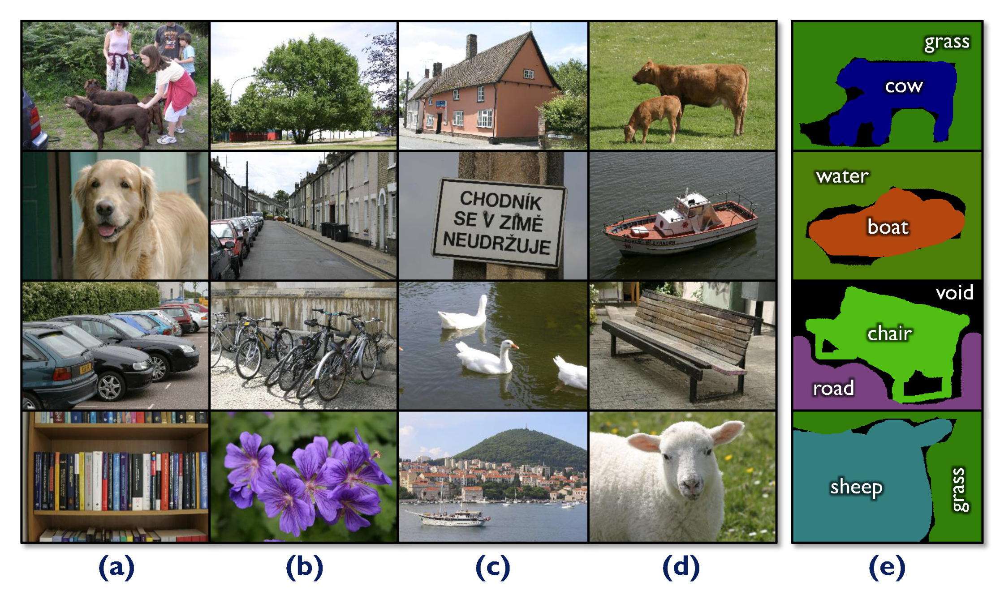

In [13]:
with open('Train.txt') as f:
    frames = f.read().splitlines()
training_imgs = [cv2.cvtColor(cv2.imread(os.path.join('MSRC_v2', frame)), cv2.COLOR_BGR2RGB) for frame in frames]
print(len(training_imgs))

276


**Understand `features_from_filter_bank()` in `lab4.py`.**

Run following code to visualize the filter response for the first training image.


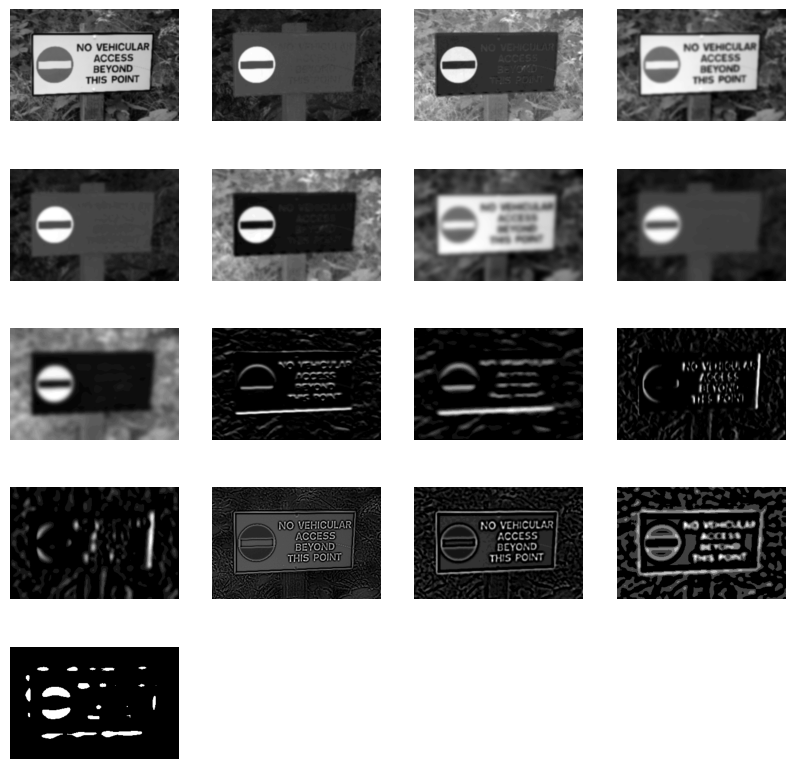

CPU times: total: 125 ms
Wall time: 316 ms


In [14]:
%%time

fig, ax = plt.subplots(ncols=4, nrows=5, figsize=(10,10))

c = features_from_filter_bank(training_imgs[0], kernels)

for i in range(20): 
    if i<17:
        ax[i//4, i%4].imshow(c[:,:,i], cmap = 'gray')
    ax[i//4, i%4].axis("off")
plt.show()

### TASK 2.1 (30%)

Next, you will learn the textons by clustering the training data (The Microsoft Research Cambridge (MSRC) database2) using the K-mean algorithm. 

**TASK 2.1: Implement `Textonization()` class in `lab4.py`.**

In [15]:
%%time
results = []

textonization = Textonization(kernels, n_clusters=200)
textonization.training(training_imgs)
gamma = 5
textures = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    feats = textonization.testing(img)
    textures.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\cluster\vq.py:137: RuntimeWarning: Some columns have standard deviation zero. The values of these columns will not change.
  warnings.warn("Some columns have standard deviation zero. "
C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1934: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)
k-mean segmentation on textons: 0it [00:00, ?it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1

CPU times: total: 2min 35s
Wall time: 3min 16s


**Understand `histogram_per_pixel()` in `lab4.py`.**

In [16]:

%%time
results = []
histogram_feat=[]
gamma = 5
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    texture = textures[i]
    feats = histogram_per_pixel(texture, window_size=49)
    histogram_feat.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()




k-mean segmentation on textons: 0it [00:00, ?it/s]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on textons: 1it [00:25, 25.16s/it]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
k-mean segmentation on textons: 2it [00:50, 25.47s/it]C:\Users\Brian\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\

: 

### TASK 2.2 (15%)

- **How does the window size of the texton histogram impact the final results?** 


The window size of the texton histogram impacts the final results by influencing the size and granularity of the segments detected. A larger window size tends to produce larger segments with less fragmentation, capturing texture boundaries of larger regions by grouping neighboring pixels with similar textures. However, this approach might overlook smaller textures or details within the image. Conversely, a smaller window size results in smaller segments that better represent texture boundaries of smaller regions, making it more effective at capturing fine details and differentiating between textures occupying smaller parts of the image.
- **Compared to segmentation based only on texton ID, what are the advantages and disadvantages? Please explain your reasoning. Hint: analyze the boundary.**


Segmentation based on texton histograms offers several advantages over segmentation based only on texton ID. Firstly, it reduces fragmentation and produces more coherent segments by considering neighboring pixels within a window, smoothing out differences between adjacent pixels and better capturing texture boundaries. Secondly, the flexibility of adjusting the window size allows for capturing segments at different scales, providing more control over the segmentation process. However, a disadvantage of using histograms is the potential loss of information and detail, as the averaging effect of histograms can lead to the grouping of different textures or details within the same segment, as seen in the example of the duck's beak not being clearly identified as part of the duck.

## Section 3: Segmentations with Optical Flow and Textons

In the final step, you need to combine the optical flow feature from Part 1 with the texture features obtained from Part 2.

**TASK 3.1: Adjust `gamma` for better results.**

In [ ]:
results = []
gamma = 3
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=histogram_feat[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 0it [00:00, ?it/s]


IndexError: list index out of range